# ---------------------------Importing and Reading the Data---------------------------

In [1]:
import pyarrow.parquet as pq
import numpy as np
import pandas as pd
import plotly.express as px
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import MinMaxScaler, StandardScaler, RobustScaler
from sklearn import preprocessing
from sklearn import metrics
import random
import warnings
warnings.filterwarnings('ignore')

# Path to the Parquet file
parquet_file = '0000 (1).parquet'

# Read the Parquet file into a PyArrow Table
table = pq.read_table(parquet_file)

# Converted PyArrow Table to a Pandas DataFrame
import pandas as pd

df = table.to_pandas()
df.head()

,Unnamed: 0,track_id,artists,album_name,track_name,popularity,duration_ms,explicit,danceability,energy,...,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,time_signature,track_genre
0,0,5SuOikwiRyPMVoIQDJUgSV,Gen Hoshino,Comedy,Comedy,73,230666,False,0.676,0.4610,...,-6.746,0,0.1430,0.0322,0.000001,0.3580,0.715,87.917,4,acoustic
1,1,4qPNDBW1i3p13qLCt0Ki3A,Ben Woodward,Ghost (Acoustic),Ghost - Acoustic,55,149610,False,0.420,0.1660,...,-17.235,1,0.0763,0.9240,0.000006,0.1010,0.267,77.489,4,acoustic
2,2,1iJBSr7s7jYXzM8EGcbK5b,Ingrid Michaelson;ZAYN,To Begin Again,To Begin Again,57,210826,False,0.438,0.3590,...,-9.734,1,0.0557,0.2100,0.000000,0.1170,0.120,76.332,4,acoustic
3,3,6lfxq3CG4xtTiEg7opyCyx,Kina Grannis,Crazy Rich Asians (Original Motion Picture Sou...,Can't Help Falling In Love,71,201933,False,0.266,0.0596,...,-18.515,1,0.0363,0.9050,0.000071,0.1320,0.143,181.740,3,acoustic
4,4,5vjLSffimiIP26QG5WcN2K,Chord Overstreet,Hold On,Hold On,82,198853,False,0.618,0.4430,...,-9.681,1,0.0526,0.4690,0.000000,0.0829,0.167,119.949,4,acoustic


# ---------------------------Data Preprocessing---------------------------

### Dropping the column names 'Unamed: 0'

In [2]:
# Dropped column 'Unnamed: 0' using drop() method
df.drop('Unnamed: 0', axis=1, inplace=True)  # axis=1 specifies that it's a column operation
df.head()

,track_id,artists,album_name,track_name,popularity,duration_ms,explicit,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,time_signature,track_genre
0,5SuOikwiRyPMVoIQDJUgSV,Gen Hoshino,Comedy,Comedy,73,230666,False,0.676,0.4610,1,-6.746,0,0.1430,0.0322,0.000001,0.3580,0.715,87.917,4,acoustic
1,4qPNDBW1i3p13qLCt0Ki3A,Ben Woodward,Ghost (Acoustic),Ghost - Acoustic,55,149610,False,0.420,0.1660,1,-17.235,1,0.0763,0.9240,0.000006,0.1010,0.267,77.489,4,acoustic
2,1iJBSr7s7jYXzM8EGcbK5b,Ingrid Michaelson;ZAYN,To Begin Again,To Begin Again,57,210826,False,0.438,0.3590,0,-9.734,1,0.0557,0.2100,0.000000,0.1170,0.120,76.332,4,acoustic
3,6lfxq3CG4xtTiEg7opyCyx,Kina Grannis,Crazy Rich Asians (Original Motion Picture Sou...,Can't Help Falling In Love,71,201933,False,0.266,0.0596,0,-18.515,1,0.0363,0.9050,0.000071,0.1320,0.143,181.740,3,acoustic
4,5vjLSffimiIP26QG5WcN2K,Chord Overstreet,Hold On,Hold On,82,198853,False,0.618,0.4430,2,-9.681,1,0.0526,0.4690,0.000000,0.0829,0.167,119.949,4,acoustic


In [3]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 114000 entries, 0 to 113999
Data columns (total 20 columns):
 #   Column            Non-Null Count   Dtype  
---  ------            --------------   -----  
 0   track_id          114000 non-null  object 
 1   artists           113999 non-null  object 
 2   album_name        113999 non-null  object 
 3   track_name        113999 non-null  object 
 4   popularity        114000 non-null  int64  
 5   duration_ms       114000 non-null  int64  
 6   explicit          114000 non-null  bool   
 7   danceability      114000 non-null  float64
 8   energy            114000 non-null  float64
 9   key               114000 non-null  int64  
 10  loudness          114000 non-null  float64
 11  mode              114000 non-null  int64  
 12  speechiness       114000 non-null  float64
 13  acousticness      114000 non-null  float64
 14  instrumentalness  114000 non-null  float64
 15  liveness          114000 non-null  float64
 16  valence           11

In [4]:
df.describe()

,popularity,duration_ms,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,time_signature
count,114000.000000,1.140000e+05,114000.000000,114000.000000,114000.000000,114000.000000,114000.000000,114000.000000,114000.000000,114000.000000,114000.000000,114000.000000,114000.000000,114000.000000
mean,33.238535,2.280292e+05,0.566800,0.641383,5.309140,-8.258960,0.637553,0.084652,0.314910,0.156050,0.213553,0.474068,122.147837,3.904035
std,22.305078,1.072977e+05,0.173542,0.251529,3.559987,5.029337,0.480709,0.105732,0.332523,0.309555,0.190378,0.259261,29.978197,0.432621
min,0.000000,0.000000e+00,0.000000,0.000000,0.000000,-49.531000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,17.000000,1.740660e+05,0.456000,0.472000,2.000000,-10.013000,0.000000,0.035900,0.016900,0.000000,0.098000,0.260000,99.218750,4.000000
50%,35.000000,2.129060e+05,0.580000,0.685000,5.000000,-7.004000,1.000000,0.048900,0.169000,0.000042,0.132000,0.464000,122.017000,4.000000
75%,50.000000,2.615060e+05,0.695000,0.854000,8.000000,-5.003000,1.000000,0.084500,0.598000,0.049000,0.273000,0.683000,140.071000,4.000000
max,100.000000,5.237295e+06,0.985000,1.000000,11.000000,4.532000,1.000000,0.965000,0.996000,1.000000,1.000000,0.995000,243.372000,5.000000


### Finding only the unique values based on the column 'track_name' and removing the duplicate values

In [5]:
track_count=len(df['track_name'].unique())
print("Unique Track Name Values:",track_count)

duplicate_rows = len(df[df.duplicated(['track_name'])])
print("Duplicate Track Name Values:",duplicate_rows)

Unique Track Name Values: 73609
Duplicate Track Name Values: 40391


In [6]:
df = df.drop_duplicates(subset=['track_name'])
df.shape

(73609, 20)

In [7]:
genres = df['track_genre'].unique()
len(genres)

113

In [8]:
genres

array(['acoustic', 'afrobeat', 'alt-rock', 'alternative', 'ambient',
       'anime', 'black-metal', 'bluegrass', 'blues', 'brazil',
       'breakbeat', 'british', 'cantopop', 'chicago-house', 'children',
       'chill', 'classical', 'club', 'comedy', 'country', 'dance',
       'dancehall', 'death-metal', 'deep-house', 'detroit-techno',
       'disco', 'disney', 'drum-and-bass', 'dub', 'dubstep', 'edm',
       'electro', 'electronic', 'emo', 'folk', 'forro', 'french', 'funk',
       'garage', 'german', 'gospel', 'goth', 'grindcore', 'groove',
       'grunge', 'guitar', 'happy', 'hard-rock', 'hardcore', 'hardstyle',
       'heavy-metal', 'hip-hop', 'honky-tonk', 'house', 'idm', 'indian',
       'indie-pop', 'indie', 'industrial', 'iranian', 'j-dance', 'j-idol',
       'j-pop', 'j-rock', 'jazz', 'k-pop', 'kids', 'latin', 'latino',
       'malay', 'mandopop', 'metal', 'metalcore', 'minimal-techno', 'mpb',
       'new-age', 'opera', 'pagode', 'party', 'piano', 'pop-film', 'pop',
       'pow

In [9]:
genre_counts =df['track_genre'].value_counts()
# pd.set_option('display.max_rows', None)
genre_counts

black-metal    981
comedy         965
afrobeat       945
heavy-metal    944
cantopop       935
              ... 
reggae         142
rock           116
house           98
indie           93
reggaeton       56
Name: track_genre, Length: 113, dtype: int64

### Plotting the graph to the Genre count of each Genre

In [10]:
# Genre Data Histogram
fig = px.histogram(df, x='track_genre', 
                   title='Genre Data Histogram',
                   labels={'track_genre': 'Genre', 'count': 'Count'},
                   category_orders={'track_genre': df['track_genre'].value_counts().index},
                   color_discrete_sequence=['#636EFA'])
fig.update_layout(xaxis_tickangle=-45)  
fig.show()

### Some Data Visualizations
### Danceability with respect to each Genre to understand the data to a greater extent

In [11]:
def create_genre_boxplot(data, title):
    fig = px.box(data, x='track_genre', y='danceability', title=title, 
                 labels={'track_genre': 'Genre', 'danceability': 'Danceability'},
                color='track_genre')
    fig.update_layout(xaxis_tickangle=-45)  
    fig.show()

# Splitting genres into four equal parts
mark = len(genres) // 4
genres1 = genres[ : mark]
genres2 = genres[mark : 2*mark]
genres3 = genres[2*mark : 3*mark]
genres4 = genres[3*mark : 4*mark]

subset1 = df[df['track_genre'].isin(genres1)]
create_genre_boxplot(subset1, 'Danceability vs Genres Division1')

subset2 = df[df['track_genre'].isin(genres2)]
create_genre_boxplot(subset2, 'Danceability vs Genres Division2')

subset3 = df[df['track_genre'].isin(genres3)]
create_genre_boxplot(subset3, 'Danceability vs Genres Division3')

subset4 = df[df['track_genre'].isin(genres4)]
create_genre_boxplot(subset4, 'Danceability vs Genres Division4')

### Energy with respect to each Genre to understand the data to a greater extent

In [12]:
def create_genre_boxplot(data, title):
    fig = px.box(data, x='track_genre', y='energy', title=title, 
                 labels={'track_genre': 'Genre', 'energy': 'Energy'},
                color='track_genre')
    fig.update_layout(xaxis_tickangle=-45)
    fig.show()

# Splitting genres into four equal parts
mark = len(genres) // 4
genres1 = genres[ : mark]
genres2 = genres[mark : 2*mark]
genres3 = genres[2*mark : 3*mark]
genres4 = genres[3*mark : 4*mark]

subset1 = df[df['track_genre'].isin(genres1)]
create_genre_boxplot(subset1, 'Energy vs Genres Division1')

subset2 = df[df['track_genre'].isin(genres2)]
create_genre_boxplot(subset2, 'Energy vs Genres Division2')

subset3 = df[df['track_genre'].isin(genres3)]
create_genre_boxplot(subset3, 'Energy vs Genres Division3')

subset4 = df[df['track_genre'].isin(genres4)]
create_genre_boxplot(subset4, 'Energy vs Genres Division4')

### Handling some data in 'instrumentalness' column to make our data more refined

In [13]:
count = df["instrumentalness"].value_counts()[0]
print(count)

# Replacing '0' values with mean
df['instrumentalness'] = df['instrumentalness'].replace(0, df['instrumentalness'].mean())

23777


### Dropping the irrelevant columns which are not required in our Target Variable (track_genre) prediction

In [14]:
df = df.drop(['track_id', 'artists', 'album_name', 'track_name', 'popularity', 'duration_ms', 'explicit', 'time_signature'], axis =1)

# Renaming a column
df.rename(columns={'track_genre': 'genre'}, inplace=True)
df

,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,genre
0,0.676,0.4610,1,-6.746,0,0.1430,0.0322,0.000001,0.3580,0.7150,87.917,acoustic
1,0.420,0.1660,1,-17.235,1,0.0763,0.9240,0.000006,0.1010,0.2670,77.489,acoustic
2,0.438,0.3590,0,-9.734,1,0.0557,0.2100,0.184374,0.1170,0.1200,76.332,acoustic
3,0.266,0.0596,0,-18.515,1,0.0363,0.9050,0.000071,0.1320,0.1430,181.740,acoustic
4,0.618,0.4430,2,-9.681,1,0.0526,0.4690,0.184374,0.0829,0.1670,119.949,acoustic
...,...,...,...,...,...,...,...,...,...,...,...,...
113994,0.331,0.1710,1,-15.668,1,0.0350,0.9200,0.022900,0.0679,0.3270,132.147,world-music
113995,0.172,0.2350,5,-16.393,1,0.0422,0.6400,0.928000,0.0863,0.0339,125.995,world-music
113996,0.174,0.1170,0,-18.318,0,0.0401,0.9940,0.976000,0.1050,0.0350,85.239,world-music
113997,0.629,0.3290,0,-10.895,0,0.0420,0.8670,0.184374,0.0839,0.7430,132.378,world-music


### Dropping genres which are less in counts in 'track_genre' column, as seen above in the graph

In [15]:
df.drop(df.loc[df['genre']=="alternative"].index, inplace=True)
df.drop(df.loc[df['genre']=="dubstep"].index, inplace=True)
df.drop(df.loc[df['genre']=="house"].index, inplace=True)
df.drop(df.loc[df['genre']=="indie"].index, inplace=True)
df.drop(df.loc[df['genre']=="jazz"].index, inplace=True)
df.drop(df.loc[df['genre']=="metal"].index, inplace=True)
df.drop(df.loc[df['genre']=="pop"].index, inplace=True)
df.drop(df.loc[df['genre']=="punk"].index, inplace=True)
df.drop(df.loc[df['genre']=="reggae"].index, inplace=True)
df.drop(df.loc[df['genre']=="reggaeton"].index, inplace=True)
df.drop(df.loc[df['genre']=="rock"].index, inplace=True)
df.drop(df.loc[df['genre']=="soul"].index, inplace=True)

df = df.reset_index(drop = True)

### These are the final set of Genres after dropping some of them above

In [16]:
x = df.loc[:,:"tempo"]
y = df["genre"]
y.unique()

array(['acoustic', 'afrobeat', 'alt-rock', 'ambient', 'anime',
       'black-metal', 'bluegrass', 'blues', 'brazil', 'breakbeat',
       'british', 'cantopop', 'chicago-house', 'children', 'chill',
       'classical', 'club', 'comedy', 'country', 'dance', 'dancehall',
       'death-metal', 'deep-house', 'detroit-techno', 'disco', 'disney',
       'drum-and-bass', 'dub', 'edm', 'electro', 'electronic', 'emo',
       'folk', 'forro', 'french', 'funk', 'garage', 'german', 'gospel',
       'goth', 'grindcore', 'groove', 'grunge', 'guitar', 'happy',
       'hard-rock', 'hardcore', 'hardstyle', 'heavy-metal', 'hip-hop',
       'honky-tonk', 'idm', 'indian', 'indie-pop', 'industrial',
       'iranian', 'j-dance', 'j-idol', 'j-pop', 'j-rock', 'k-pop', 'kids',
       'latin', 'latino', 'malay', 'mandopop', 'metalcore',
       'minimal-techno', 'mpb', 'new-age', 'opera', 'pagode', 'party',
       'piano', 'pop-film', 'power-pop', 'progressive-house',
       'psych-rock', 'punk-rock', 'r-n-b', 'r

### Checking Data for skewness

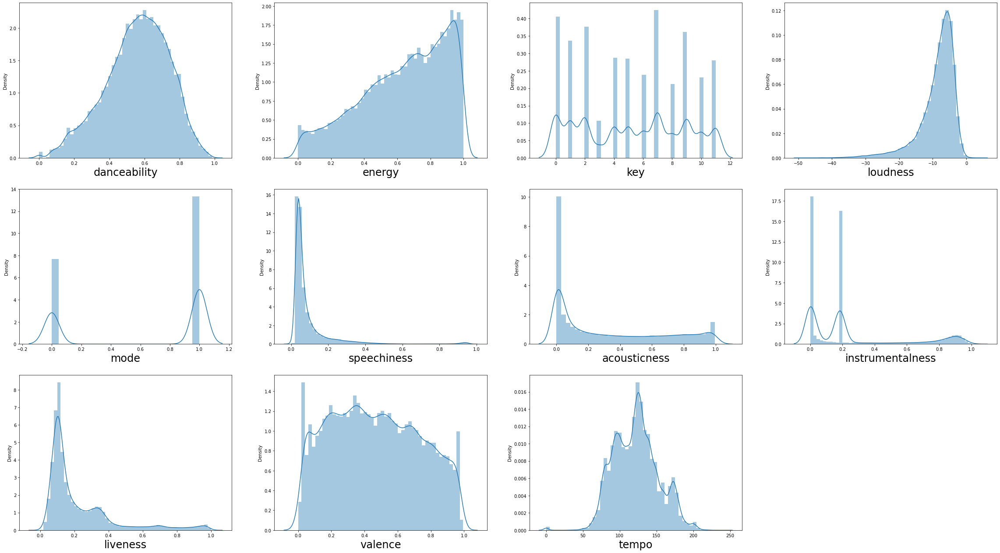

In [17]:
k=0
plt.figure(figsize = (40,30))
for i in x.columns:
    plt.subplot(4,4, k + 1)
    sns.distplot(x[i])
    plt.xlabel(i, fontsize=24)
    k +=1

### Handling Skewness as much as possible

In [18]:
from sklearn.preprocessing import PowerTransformer
pt = PowerTransformer(method='yeo-johnson')

transformed_feature = pt.fit_transform(df[['speechiness']])
df['speechiness'] = transformed_feature

transformed_feature = pt.fit_transform(df[['acousticness']])
df['acousticness'] = transformed_feature

transformed_feature = pt.fit_transform(df[['instrumentalness']])
df['instrumentalness'] = transformed_feature

transformed_feature = pt.fit_transform(df[['liveness']])
df['liveness'] = transformed_feature

offset = 0.1
df.loc[df['energy'] > 0, 'energy'] = np.arcsin(df.loc[df['energy'] > 0, 'energy'])

In [19]:
x = df.loc[:,:"tempo"]
y = df["genre"]

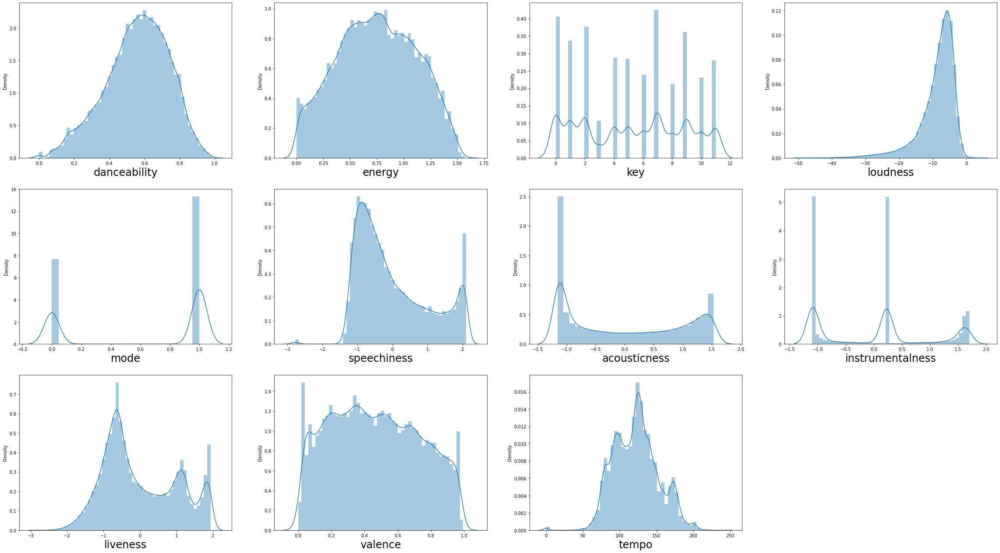

In [20]:
k=0
plt.figure(figsize = (40,30))
for i in x.columns:
    plt.subplot(4,4, k + 1)
    sns.distplot(x[i])
    plt.xlabel(i, fontsize=24)
    k +=1

### Still there are lot of Genres 
### Further categorizing them in a more generalized manner so that out model gets trained efficiently

In [21]:
subgenre_categories = {
    'black-metal': 'rock',
    'grunge': 'rock',
    'hard-rock': 'rock',
    'heavy-metal': 'rock',
    'punk-rock': 'rock',
    'rock-n-roll': 'rock',
    'alt-rock': 'rock',
    'death-metal': 'rock',
    'psych-rock': 'rock',
    'hardcore': 'rock',
    'j-rock': 'rock',
    'rockabilly': 'rock',
    'gothic': 'rock',
    'goth': 'rock',
    'indie-pop': 'pop',
    'power-pop': 'pop',
    'r-n-b': 'pop',
    'synth-pop': 'pop',
    'electronic': 'pop',
    'electro': 'pop',
    'edm': 'pop',
    'disco': 'pop',
    'hip-hop': 'pop',
    'pop': 'pop',
    'pop-film': 'pop',
    'progressive-house': 'pop',
    'j-idol': 'pop',
    'j-pop': 'pop',
    'k-pop': 'pop',
    'afrobeat': 'cultural',
    'anime': 'cultural',
    'brazilian': 'cultural',
    'british': 'cultural',
    'french': 'cultural',
    'german': 'cultural',
    'indian': 'cultural',
    'iranian': 'cultural',
    'latin': 'cultural',
    'latino': 'cultural',
    'malay': 'cultural',
    'mandopop': 'cultural',
    'spanish': 'cultural',
    'swedish': 'cultural',
    'turkish': 'cultural',
    'world-music': 'cultural',
    'brazil': 'cultural',
    'sertanejo': 'cultural',
    'salsa': 'cultural',
    'samba': 'cultural',
    'forro': 'cultural',
    'tango': 'cultural',
    'classical': 'jazz',
    'jazz': 'jazz',
    'opera': 'jazz',
    'blues': 'jazz',
    'honky-tonk': 'jazz',
    'chicago-house': 'dance',
    'dancehall': 'dance',
    'deep-house': 'dance',
    'detroit-techno': 'dance',
    'drum-and-bass': 'dance',
    'dub': 'dance',
    'techno': 'dance',
    'trance': 'dance',
    'club': 'dance',
    'dance-metal': 'dance',
    'hardstyle': 'dance',
    'j-dance': 'dance',
    'bluegrass': 'country',
    'country': 'country',
    'folk': 'country',
    'gospel': 'country',
    'acoustic': 'ambient',
    'ambient': 'ambient',
    'chill': 'ambient',
    'children': 'ambient',
    'comedy': 'ambient',
    'disney': 'ambient',
    'emo': 'ambient',
    'funk': 'ambient',
    'garage': 'ambient',
    'groove': 'ambient',
    'guitar': 'ambient',
    'happy': 'ambient',
    'new-age': 'ambient',
    'romance': 'ambient',
    'sad': 'ambient',
    'show-tunes': 'ambient',
    'singer-songwriter': 'ambient',
    'ska': 'ambient',
    'sleep': 'ambient',
    'study': 'ambient',
    'trip-hop': 'ambient',
    'kids': 'ambient',
    'breakbeat': 'others',
    'cantopop': 'others',
    'party': 'others',
    'piano': 'others',
    'grindcore': 'others',
    'idm': 'others',
    'industrial': 'others',
    'metalcore': 'others',
    'minimal-techno': 'others',
    'mpb': 'others',
    'opere': 'others',
    'pagode': 'others'
}


# Replacing values in the "Genre" column with their categories
df['genre'] = df['genre'].replace(subgenre_categories)

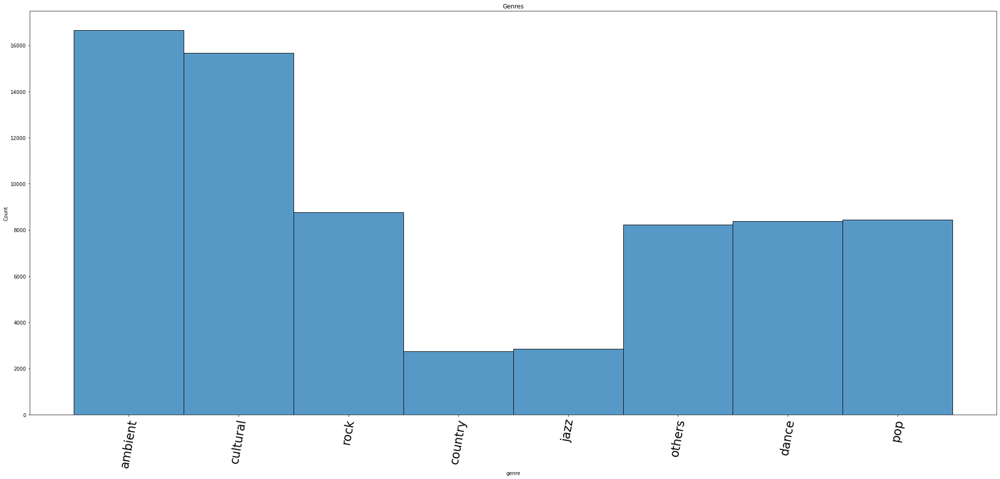

In [22]:
plt.figure(figsize=(35, 15))  # Set the figure size as needed
ax = sns.histplot(df["genre"])
plt.xticks(rotation=80, fontsize=24)
plt.title("Genres")
plt.show()

### The data is quite unbalanced, so doing some oversampling to balance the data.

In [23]:
#-----------rock column-----------
rows_to_duplicate = []
for i in range(len(df)):
    if df.iloc[i]['genre'] == 'rock':
        rows_to_duplicate.append(i)

# Giving the number of times to duplicate the rows
oversampling_factor = 2  

# Duplicating rows of 'rock' genre
rows_duplicated = rows_to_duplicate * (oversampling_factor - 1)

# Concatenating the duplicated rows with the original DataFrame
df_oversampled = pd.concat([df, df.iloc[rows_duplicated]], ignore_index=True)


#-----------country column-----------
rows_to_duplicate = []
for i in range(len(df_oversampled)):
    if df_oversampled.iloc[i]['genre'] == 'country':
        rows_to_duplicate.append(i)

# Giving the number of times to duplicate the rows
oversampling_factor = 6

# Duplicating rows of 'country' genre
rows_duplicated = rows_to_duplicate * (oversampling_factor - 1)

# Concatenating the duplicated rows with the original DataFrame
df_oversampled1 = pd.concat([df_oversampled, df_oversampled.iloc[rows_duplicated]], ignore_index=True)


#-----------jazz column-----------
rows_to_duplicate = []
for i in range(len(df_oversampled1)):
    if df_oversampled1.iloc[i]['genre'] == 'jazz':
        rows_to_duplicate.append(i)

# Giving the number of times to duplicate the rows
oversampling_factor = 6

# Duplicating rows of 'jazz' genre
rows_duplicated = rows_to_duplicate * (oversampling_factor - 1)

# Concatenating the duplicated rows with the original DataFrame
df_oversampled2 = pd.concat([df_oversampled1, df_oversampled1.iloc[rows_duplicated]], ignore_index=True)


#-----------others column-----------
rows_to_duplicate = []
for i in range(len(df_oversampled2)):
    if df_oversampled2.iloc[i]['genre'] == 'others':
        rows_to_duplicate.append(i)

# Giving the number of times to duplicate the rows
oversampling_factor = 2

# Duplicating rows of 'others' genre
rows_duplicated = rows_to_duplicate * (oversampling_factor - 1)

# Concatenating the duplicated rows with the original DataFrame
df_oversampled3 = pd.concat([df_oversampled2, df_oversampled2.iloc[rows_duplicated]], ignore_index=True)


#-----------dance column-----------
rows_to_duplicate = []
for i in range(len(df_oversampled3)):
    if df_oversampled3.iloc[i]['genre'] == 'dance':
        rows_to_duplicate.append(i)

# Giving the number of times to duplicate the rows
oversampling_factor = 2

# Duplicating rows of 'dance' genre
rows_duplicated = rows_to_duplicate * (oversampling_factor - 1)

# Concatenating the duplicated rows with the original DataFrame
df_oversampled4 = pd.concat([df_oversampled3, df_oversampled3.iloc[rows_duplicated]], ignore_index=True)


#-----------pop column-----------
rows_to_duplicate = []
for i in range(len(df_oversampled4)):
    if df_oversampled4.iloc[i]['genre'] == 'pop':
        rows_to_duplicate.append(i)

# Giving the number of times to duplicate the rows
oversampling_factor = 2

# Duplicating rows of 'pop' genre
rows_duplicated = rows_to_duplicate * (oversampling_factor - 1)

# Concatenating the duplicated rows with the original DataFrame
df_oversampled5 = pd.concat([df_oversampled4, df_oversampled4.iloc[rows_duplicated]], ignore_index=True)

In [24]:
df_oversampled5.shape

(133498, 12)

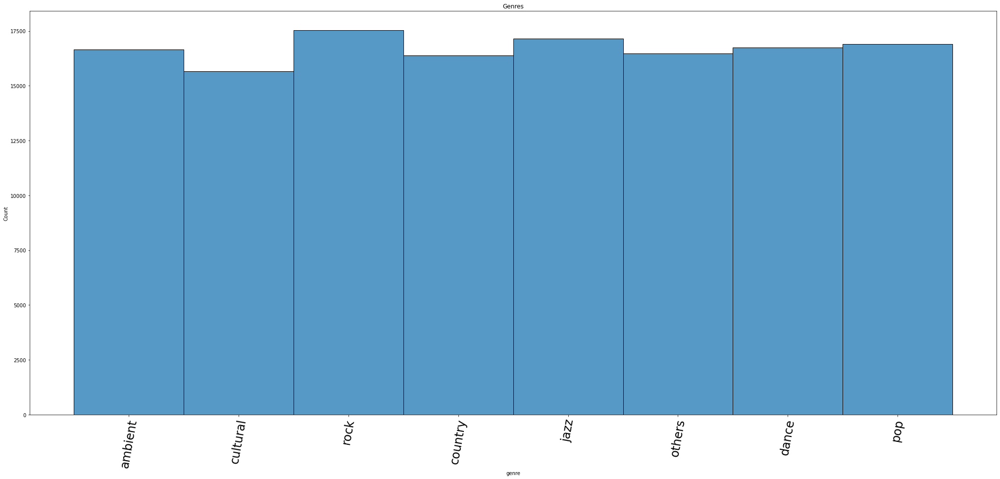

In [25]:
plt.figure(figsize=(35, 15))  # Set the figure size as needed
ax = sns.histplot(df_oversampled5["genre"])
plt.xticks(rotation=80, fontsize=24)
plt.title("Genres")
plt.show()

# ---------------------------Model Building---------------------------

### Scaling the data x, and encoding our target variable y

In [26]:
x = df_oversampled5.loc[:,:"tempo"]
y = df_oversampled5["genre"]

scaler = RobustScaler()
x = scaler.fit_transform(x)

le = preprocessing.LabelEncoder()
y = le.fit_transform(y)

xtrain, xtest, ytrain, ytest = train_test_split(x, y, test_size= 0.1, random_state=42, shuffle = True)

### Logistic Regression

In [27]:
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import accuracy_score

# Creating Logistic Regression model
logistic = LogisticRegression()

# hyperparameters for tuning
params = {
    'C': [0.01, 0.1, 1, 10], 
    'penalty': [None,'l1', 'l2', 'elasticnet'],
    'solver': ['liblinear', 'lbfgs', 'newton-cg', 'sag', 'saga'],
    'class_weight': [None, 'balanced']
}

# Applying GridSearchCV for hyperparameter tuning
grid_search = GridSearchCV(logistic, params, cv=5, scoring='accuracy')
grid_search.fit(xtrain, ytrain)

# Best hyperparameters from the grid search
best_params = grid_search.best_params_
print("Best Hyperparameters:", best_params)

# Using the best model for prediction
best_model = grid_search.best_estimator_
ypred1 = best_model.predict(xtest)

# Evaluating the model
score1 = accuracy_score(ytest, ypred1)
print("Accuracy Score:", score1)
print("")
print("Classification Report:")
print(metrics.classification_report(ytest, ypred1))

Best Hyperparameters: {'C': 0.01, 'class_weight': None, 'penalty': 'l1', 'solver': 'saga'}
Accuracy Score: 0.35842696629213483

Classification Report:
              precision    recall  f1-score   support

           0       0.34      0.25      0.29      1663
           1       0.33      0.44      0.37      1622
           2       0.25      0.08      0.12      1571
           3       0.41      0.54      0.47      1703
           4       0.43      0.61      0.51      1685
           5       0.27      0.11      0.15      1661
           6       0.27      0.26      0.26      1692
           7       0.38      0.56      0.45      1753

    accuracy                           0.36     13350
   macro avg       0.33      0.35      0.33     13350
weighted avg       0.34      0.36      0.33     13350



### KNN Classifier

In [28]:
from sklearn.neighbors import KNeighborsClassifier

# Creating KNN model
knn = KNeighborsClassifier()

# hyperparameters for tuning
params = {
    'n_neighbors': [3, 5, 7, 9], 
    'weights': ['uniform', 'distance'],
    'metric': ['euclidean', 'manhattan']
}

# Applying GridSearchCV for hyperparameter tuning
grid_search = GridSearchCV(knn, params, cv=5, scoring='accuracy')
grid_search.fit(xtrain, ytrain)

# Best hyperparameters from the grid search
best_params = grid_search.best_params_
print("Best Hyperparameters:", best_params)

# Using the best model for prediction
best_model = grid_search.best_estimator_
ypred2 = best_model.predict(xtest)

# Evaluating the model
score2 = accuracy_score(ytest, ypred2)
print("Accuracy Score:", score2)
print("")
print("Classification Report:")
print(metrics.classification_report(ytest, ypred2))

Best Hyperparameters: {'metric': 'manhattan', 'n_neighbors': 3, 'weights': 'distance'}
Accuracy Score: 0.7916104868913858

Classification Report:
              precision    recall  f1-score   support

           0       0.70      0.32      0.44      1663
           1       0.87      1.00      0.93      1622
           2       0.58      0.22      0.32      1571
           3       0.81      0.94      0.87      1703
           4       0.87      1.00      0.93      1685
           5       0.77      0.93      0.84      1661
           6       0.75      0.92      0.83      1692
           7       0.79      0.95      0.86      1753

    accuracy                           0.79     13350
   macro avg       0.77      0.79      0.75     13350
weighted avg       0.77      0.79      0.76     13350



### Support Vector Classifier (SVC)

In [29]:
from sklearn.svm import SVC

# Creating SVC model
svc = SVC()
svc.fit(xtrain, ytrain)
ypred3 = svc.predict(xtest)

# Evaluating the model
score3 = accuracy_score(ytest, ypred3)
print("Accuracy Score:", score3)
print("")
print("Classification Report:")
print(metrics.classification_report(ytest, ypred3))

Accuracy Score: 0.4293632958801498

Classification Report:
              precision    recall  f1-score   support

           0       0.50      0.30      0.38      1663
           1       0.36      0.58      0.45      1622
           2       0.35      0.19      0.25      1571
           3       0.47      0.64      0.54      1703
           4       0.53      0.65      0.59      1685
           5       0.50      0.17      0.26      1661
           6       0.31      0.33      0.32      1692
           7       0.44      0.55      0.49      1753

    accuracy                           0.43     13350
   macro avg       0.43      0.43      0.41     13350
weighted avg       0.43      0.43      0.41     13350



### Decision Tree Classifier

In [30]:
from sklearn.tree import DecisionTreeClassifier

# Creating Decision Tree Classifier model
dt_classifier = DecisionTreeClassifier()

# hyperparameters for tuning
params = {
    'criterion': ['gini', 'entropy'],
    'max_depth': [3, 5, 7, 9], 
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [2, 5, 7, 10, 15, 20]
}

# Applying GridSearchCV for hyperparameter tuning
grid_search = GridSearchCV(dt_classifier, params, cv=5, scoring='accuracy')
grid_search.fit(xtrain, ytrain)

# Best hyperparameters from the grid search
best_params = grid_search.best_params_
print("Best Hyperparameters:", best_params)

# Using the best model for prediction
best_model = grid_search.best_estimator_
ypred4 = best_model.predict(xtest)

# Evaluating the model
score4 = accuracy_score(ytest, ypred4)
print("Accuracy Score:", score4)
print("")
print("Classification Report:")
print(metrics.classification_report(ytest, ypred4))

Best Hyperparameters: {'criterion': 'gini', 'max_depth': 9, 'min_samples_leaf': 5, 'min_samples_split': 2}
Accuracy Score: 0.39445692883895134

Classification Report:
              precision    recall  f1-score   support

           0       0.38      0.29      0.33      1663
           1       0.34      0.58      0.43      1622
           2       0.24      0.19      0.21      1571
           3       0.43      0.59      0.50      1703
           4       0.59      0.55      0.57      1685
           5       0.46      0.18      0.26      1661
           6       0.27      0.27      0.27      1692
           7       0.47      0.48      0.48      1753

    accuracy                           0.39     13350
   macro avg       0.40      0.39      0.38     13350
weighted avg       0.40      0.39      0.38     13350



### Random Forest Classifier

In [31]:
from sklearn.ensemble import RandomForestClassifier

# Creating Random Forest Classifier model
rf_classifier = RandomForestClassifier()

# hyperparameters for tuning
params = {
    'n_estimators': [100, 200],
    'criterion': ['gini', 'entropy'],
    'max_depth': [None, 5, 10, 15],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4]
}

# Applying GridSearchCV for hyperparameter tuning
grid_search = GridSearchCV(rf_classifier, params, cv=5, scoring='accuracy')
grid_search.fit(xtrain, ytrain)

# Best hyperparameters from the grid search
best_params = grid_search.best_params_
print("Best Hyperparameters:", best_params)

# Using the best model for prediction
best_model = grid_search.best_estimator_
ypred5 = best_model.predict(xtest)

# Evaluating the model
score5 = accuracy_score(ytest, ypred5)
print("Accuracy Score:", score5)
print("")
print("Classification Report:")
print(metrics.classification_report(ytest, ypred5))

Best Hyperparameters: {'criterion': 'gini', 'max_depth': None, 'min_samples_leaf': 1, 'min_samples_split': 2, 'n_estimators': 200}
Accuracy Score: 0.8425468164794008

Classification Report:
              precision    recall  f1-score   support

           0       0.72      0.49      0.58      1663
           1       0.94      1.00      0.97      1622
           2       0.62      0.46      0.53      1571
           3       0.84      0.95      0.89      1703
           4       0.95      1.00      0.97      1685
           5       0.93      0.92      0.92      1661
           6       0.82      0.92      0.87      1692
           7       0.82      0.97      0.89      1753

    accuracy                           0.84     13350
   macro avg       0.83      0.84      0.83     13350
weighted avg       0.83      0.84      0.83     13350



### Neural Networks

In [32]:
import tensorflow as tf
from tensorflow import keras

early_stopping1 = keras.callbacks.EarlyStopping(monitor = "val_loss", patience = 10, restore_best_weights = True)
early_stopping2 = keras.callbacks.EarlyStopping(monitor = "val_accuracy", patience = 10, restore_best_weights = True)

model = keras.Sequential([
    keras.layers.Input(name = "input", shape = (xtrain.shape[1])),
    keras.layers.Dense(1024, activation = "relu"),
    keras.layers.BatchNormalization(),
    keras.layers.Dropout(0.1),
    keras.layers.Dense(512, activation = "relu"),
    keras.layers.Dense(512, activation = "relu"),
    keras.layers.BatchNormalization(),
    keras.layers.Dropout(0.1),
    keras.layers.Dense(512, activation = "relu"),
    keras.layers.BatchNormalization(),
    keras.layers.Dropout(0.1),
    keras.layers.Dense(256, activation = "relu"),
    keras.layers.Dense(max(ytrain)+1, activation = "softmax")
])

model.summary()

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 1024)              12288     
_________________________________________________________________
batch_normalization (BatchNo (None, 1024)              4096      
_________________________________________________________________
dropout (Dropout)            (None, 1024)              0         
_________________________________________________________________
dense_1 (Dense)              (None, 512)               524800    
_________________________________________________________________
dense_2 (Dense)              (None, 512)               262656    
_________________________________________________________________
batch_normalization_1 (Batch (None, 512)               2048      
_________________________________________________________________
dropout_1 (Dropout)          (None, 512)               0

In [33]:
model.compile(optimizer = keras.optimizers.Adam(),
            loss = "sparse_categorical_crossentropy",
            metrics = ["accuracy"])

model_history = model.fit(xtrain, ytrain,
                epochs = 100,
                verbose = 1, batch_size = 128,
                validation_data = (xtest, ytest),
                callbacks = [early_stopping1, early_stopping2])

Epoch 1/100
939/939 [==============================] - 10s 11ms/step - loss: 1.6769 - accuracy: 0.3754 - val_loss: 1.6133 - val_accuracy: 0.3934
Epoch 2/100
939/939 [==============================] - 10s 10ms/step - loss: 1.5648 - accuracy: 0.4142 - val_loss: 1.5497 - val_accuracy: 0.4196
Epoch 3/100
939/939 [==============================] - 10s 10ms/step - loss: 1.5301 - accuracy: 0.4264 - val_loss: 1.5294 - val_accuracy: 0.4238
Epoch 4/100
939/939 [==============================] - 11s 11ms/step - loss: 1.5052 - accuracy: 0.4355 - val_loss: 1.5083 - val_accuracy: 0.4320
Epoch 5/100
939/939 [==============================] - 10s 11ms/step - loss: 1.4810 - accuracy: 0.4452 - val_loss: 1.4816 - val_accuracy: 0.4404
Epoch 6/100
939/939 [==============================] - 10s 11ms/step - loss: 1.4479 - accuracy: 0.4570 - val_loss: 1.4515 - val_accuracy: 0.4546
Epoch 7/100
939/939 [==============================] - 10s 11ms/step - loss: 1.4117 - accuracy: 0.4710 - val_loss: 1.4192 - val_ac

939/939 [==============================] - 10s 11ms/step - loss: 0.6048 - accuracy: 0.7761 - val_loss: 0.8237 - val_accuracy: 0.7363
Epoch 58/100
939/939 [==============================] - 11s 11ms/step - loss: 0.6031 - accuracy: 0.7768 - val_loss: 0.8234 - val_accuracy: 0.7366
Epoch 59/100
939/939 [==============================] - 10s 11ms/step - loss: 0.5929 - accuracy: 0.7809 - val_loss: 0.8073 - val_accuracy: 0.7421
Epoch 60/100
939/939 [==============================] - 10s 11ms/step - loss: 0.5876 - accuracy: 0.7829 - val_loss: 0.8187 - val_accuracy: 0.7377
Epoch 61/100
939/939 [==============================] - 10s 11ms/step - loss: 0.5848 - accuracy: 0.7834 - val_loss: 0.8205 - val_accuracy: 0.7401
Epoch 62/100
939/939 [==============================] - 10s 11ms/step - loss: 0.5811 - accuracy: 0.7842 - val_loss: 0.8170 - val_accuracy: 0.7387
Epoch 63/100
939/939 [==============================] - 10s 11ms/step - loss: 0.5745 - accuracy: 0.7878 - val_loss: 0.8128 - val_accuracy

In [34]:
print(model.evaluate(xtest, ytest))

418/418 [==============================] - 0s 1ms/step - loss: 0.7680 - accuracy: 0.7751
[0.7680159211158752, 0.7750561833381653]


In [35]:
# Evaluating the model
ypred6 = model.predict(xtest).argmax(axis=1)

score6 = accuracy_score(ytest, ypred6)
print("Accuracy Score:", score6)
print("")
print("Classification Report:")
print(metrics.classification_report(ytest, ypred6))

Accuracy Score: 0.7750561797752809

Classification Report:
              precision    recall  f1-score   support

           0       0.61      0.42      0.50      1663
           1       0.90      1.00      0.95      1622
           2       0.56      0.36      0.44      1571
           3       0.78      0.89      0.83      1703
           4       0.90      1.00      0.95      1685
           5       0.76      0.80      0.78      1661
           6       0.75      0.83      0.79      1692
           7       0.78      0.87      0.82      1753

    accuracy                           0.78     13350
   macro avg       0.76      0.77      0.76     13350
weighted avg       0.76      0.78      0.76     13350



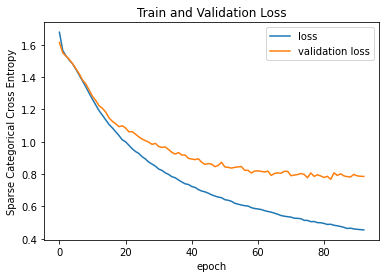

In [36]:
plt.plot(model_history.history["loss"])
plt.plot(model_history.history["val_loss"])
plt.legend(["loss", "validation loss"], loc ="upper right")
plt.title("Train and Validation Loss")
plt.xlabel("epoch")
plt.ylabel("Sparse Categorical Cross Entropy")
plt.show()

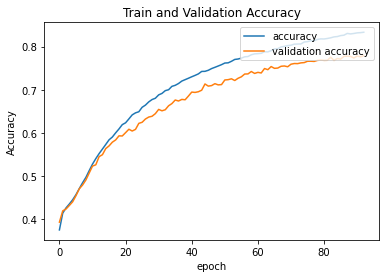

In [37]:
plt.plot(model_history.history["accuracy"])
plt.plot(model_history.history["val_accuracy"])
plt.legend(["accuracy", "validation accuracy"], loc ="upper right")
plt.title("Train and Validation Accuracy")
plt.xlabel("epoch")
plt.ylabel("Accuracy")
plt.show()

# Final Results

In [38]:
final_results = pd.DataFrame(
    {
        'Model': ['Logistic Regression', 'KNN Classifier', 'SVC', 'Decision Tree Classifier', 'Random Forest Classifier', 'Neural Networks'],
        'Score': [score1, score2, score3, score4, score5, score6]
    }
)

# Sorted the DataFrame by 'Score' column in descending order
final_results = final_results.sort_values(by='Score', ascending=False)

# Displayed the sorted DataFrame with 'Score' as index
final_results = final_results.set_index('Score')
final_results

,Model
Score,
0.842547,Random Forest Classifier
0.791610,KNN Classifier
0.775056,Neural Networks
0.429363,SVC
0.394457,Decision Tree Classifier
0.358427,Logistic Regression
